In [0]:
from csv import reader
from pyspark.sql import Row 
from pyspark.sql import SparkSession
from pyspark.sql.types import *
from pyspark.sql.functions import *
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
 
import os
os.environ["PYSPARK_PYTHON"] = "python3"

In [0]:
import urllib.request
urllib.request.urlretrieve("https://data.lacity.org/api/views/63jg-8b9z/rows.csv?accessType=DOWNLOAD",'/tmp/LA_crimedata.csv')

In [0]:
dbutils.fs.mv("file:/tmp/LA_crimedata.csv", "dbfs:/jm_spark101/data/LA_crimedata.csv")
display(dbutils.fs.ls("dbfs:/jm_spark101/data/"))

path,name,size,modificationTime
dbfs:/jm_spark101/data/LA_crimedata.csv,LA_crimedata.csv,537170504,1713915435000


In [0]:
data_path = "dbfs:/jm_spark101/data/LA_crimedata.csv"

In [0]:
from pyspark.sql import SparkSession

# pyspark.sql.SparkSession is the main entry point for DataFrame and SQL functionality
# A SparkSession can be used to create DataFrame, register DataFrame as tables, execute SQL over tables, cache tables, and read parquet files

spark = SparkSession.builder.appName("crime analysis").config("spark.some.config.option", "some-value").getOrCreate()

df_opt1 = spark.read.format("csv").option("header","true").load(data_path)

In [0]:
display(df_opt1)

DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
001307355,02/20/2010 12:00:00 AM,02/20/2010 12:00:00 AM,1350,13,Newton,1385,2,900,VIOLATION OF COURT ORDER,0913 1814 2000,48,M,H,501,SINGLE FAMILY DWELLING,null,null,AA,Adult Arrest,900,null,null,null,300 E GAGE AV,null,33.9825,-118.2695
011401303,09/13/2010 12:00:00 AM,09/12/2010 12:00:00 AM,0045,14,Pacific,1485,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)",0329,0,M,W,101,STREET,null,null,IC,Invest Cont,740,null,null,null,SEPULVEDA BL,MANCHESTER AV,33.9599,-118.3962
070309629,08/09/2010 12:00:00 AM,08/09/2010 12:00:00 AM,1515,13,Newton,1324,2,946,OTHER MISCELLANEOUS CRIME,0344,0,M,H,103,ALLEY,null,null,IC,Invest Cont,946,null,null,null,1300 E 21ST ST,null,34.0224,-118.2524
090631215,01/05/2010 12:00:00 AM,01/05/2010 12:00:00 AM,0150,06,Hollywood,0646,2,900,VIOLATION OF COURT ORDER,1100 0400 1402,47,F,W,101,STREET,102,HAND GUN,IC,Invest Cont,900,998,null,null,CAHUENGA BL,HOLLYWOOD BL,34.1016,-118.3295
100100501,01/03/2010 12:00:00 AM,01/02/2010 12:00:00 AM,2100,01,Central,0176,1,122,"RAPE, ATTEMPTED",0400,47,F,H,103,ALLEY,400,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",IC,Invest Cont,122,null,null,null,8TH ST,SAN PEDRO ST,34.0387,-118.2488
100100506,01/05/2010 12:00:00 AM,01/04/2010 12:00:00 AM,1650,01,Central,0162,1,442,SHOPLIFTING - PETTY THEFT ($950 & UNDER),0344 1402,23,M,B,404,DEPARTMENT STORE,null,null,AA,Adult Arrest,442,null,null,null,700 W 7TH ST,null,34.048,-118.2577
100100508,01/08/2010 12:00:00 AM,01/07/2010 12:00:00 AM,2005,01,Central,0182,1,330,BURGLARY FROM VEHICLE,0344,46,M,H,101,STREET,null,null,IC,Invest Cont,330,null,null,null,PICO BL,GRAND AV,34.0389,-118.2643
100100509,01/09/2010 12:00:00 AM,01/08/2010 12:00:00 AM,2100,01,Central,0157,1,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",0416,51,M,B,710,OTHER PREMISE,500,UNKNOWN WEAPON/OTHER WEAPON,AA,Adult Arrest,230,null,null,null,500 CROCKER ST,null,34.0435,-118.2427
100100510,01/09/2010 12:00:00 AM,01/09/2010 12:00:00 AM,0230,01,Central,0171,1,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",0400 0416,30,M,H,108,PARKING LOT,400,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",IC,Invest Cont,230,null,null,null,800 W OLYMPIC BL,null,34.045,-118.264
100100511,01/09/2010 12:00:00 AM,01/06/2010 12:00:00 AM,2100,01,Central,0132,1,341,"THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD",0344 1402,55,M,W,710,OTHER PREMISE,null,null,IC,Invest Cont,341,998,null,null,200 S OLIVE ST,null,34.0538,-118.2488


In [0]:
df_opt1.createOrReplaceTempView("LA_crime")

In [0]:
df_opt1.printSchema()

root
 |-- DR_NO: string (nullable = true)
 |-- Date Rptd: string (nullable = true)
 |-- DATE OCC: string (nullable = true)
 |-- TIME OCC: string (nullable = true)
 |-- AREA : string (nullable = true)
 |-- AREA NAME: string (nullable = true)
 |-- Rpt Dist No: string (nullable = true)
 |-- Part 1-2: string (nullable = true)
 |-- Crm Cd: string (nullable = true)
 |-- Crm Cd Desc: string (nullable = true)
 |-- Mocodes: string (nullable = true)
 |-- Vict Age: string (nullable = true)
 |-- Vict Sex: string (nullable = true)
 |-- Vict Descent: string (nullable = true)
 |-- Premis Cd: string (nullable = true)
 |-- Premis Desc: string (nullable = true)
 |-- Weapon Used Cd: string (nullable = true)
 |-- Weapon Desc: string (nullable = true)
 |-- Status: string (nullable = true)
 |-- Status Desc: string (nullable = true)
 |-- Crm Cd 1: string (nullable = true)
 |-- Crm Cd 2: string (nullable = true)
 |-- Crm Cd 3: string (nullable = true)
 |-- Crm Cd 4: string (nullable = true)
 |-- LOCATION: str

In [0]:
from pyspark.sql.functions import *
df_update = df_opt1.withColumn("Date Rptd", to_date(col("Date Rptd"), "MM/dd/yyyy"))
df_update = df_update.withColumn('DATE OCC', to_timestamp(df_opt1['DATE OCC'], 'MM/dd/yyyy HH:mm'))

df_update = df_update.withColumn('TIME OCC', to_timestamp(df_opt1['TIME OCC'], 'HHmm'))
df_update = df_update.withColumn('hour_OCC', hour(col('TIME OCC')))
df_update = df_update.withColumn('minute_OCC', minute(col('TIME OCC')))
df_update = df_update.withColumn('second_OCC', second(col('TIME OCC')))

df_update.createOrReplaceTempView("LA_crime")

In [0]:
from pyspark.sql import SparkSession

spark = SparkSession.builder \
    .appName("YourAppName") \
    .config("spark.sql.legacy.timeParserPolicy", "LEGACY") \
    .getOrCreate()

In [0]:
%sql
select * from LA_crime limit 5

DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON,hour_OCC,minute_OCC,second_OCC
001307355,2010-02-20,2010-02-20T12:00:00.000+0000,1970-01-01T13:50:00.000+0000,13,Newton,1385,2,900,VIOLATION OF COURT ORDER,0913 1814 2000,48,M,H,501,SINGLE FAMILY DWELLING,null,null,AA,Adult Arrest,900,null,null,null,300 E GAGE AV,null,33.9825,-118.2695,13,50,0
011401303,2010-09-13,2010-09-12T12:00:00.000+0000,1970-01-01T00:45:00.000+0000,14,Pacific,1485,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)",0329,0,M,W,101,STREET,null,null,IC,Invest Cont,740,null,null,null,SEPULVEDA BL,MANCHESTER AV,33.9599,-118.3962,0,45,0
070309629,2010-08-09,2010-08-09T12:00:00.000+0000,1970-01-01T15:15:00.000+0000,13,Newton,1324,2,946,OTHER MISCELLANEOUS CRIME,0344,0,M,H,103,ALLEY,null,null,IC,Invest Cont,946,null,null,null,1300 E 21ST ST,null,34.0224,-118.2524,15,15,0
090631215,2010-01-05,2010-01-05T12:00:00.000+0000,1970-01-01T01:50:00.000+0000,06,Hollywood,0646,2,900,VIOLATION OF COURT ORDER,1100 0400 1402,47,F,W,101,STREET,102,HAND GUN,IC,Invest Cont,900,998,null,null,CAHUENGA BL,HOLLYWOOD BL,34.1016,-118.3295,1,50,0
100100501,2010-01-03,2010-01-02T12:00:00.000+0000,1970-01-01T21:00:00.000+0000,01,Central,0176,1,122,"RAPE, ATTEMPTED",0400,47,F,H,103,ALLEY,400,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",IC,Invest Cont,122,null,null,null,8TH ST,SAN PEDRO ST,34.0387,-118.2488,21,0,0


In [0]:
#Q1 counts the number of crimes for different category

In [0]:
%sql
select count(distinct `Crm Cd Desc`) as number_of_crime_category
from LA_crime

number_of_crime_category
142


In [0]:
%sql
select distinct `Crm Cd`, `Crm Cd Desc` from LA_crime

Crm Cd,Crm Cd Desc
670,"EMBEZZLEMENT, PETTY THEFT ($950 & UNDER)"
420,THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER)
352,PICKPOCKET
624,BATTERY - SIMPLE ASSAULT
121,"RAPE, FORCIBLE"
950,"DEFRAUDING INNKEEPER/THEFT OF SERVICES, OVER $950.01"
815,SEXUAL PENETRATION W/FOREIGN OBJECT
453,DRUNK ROLL - ATTEMPT
443,SHOPLIFTING - ATTEMPT
438,RECKLESS DRIVING


In [0]:
%sql
select `Crm Cd Desc` as Crime_category, count(*) as cnt
from LA_crime
group by 1
order by 2 desc
limit 10

Crime_category,cnt
BATTERY - SIMPLE ASSAULT,190597
BURGLARY FROM VEHICLE,162194
VEHICLE - STOLEN,159937
THEFT PLAIN - PETTY ($950 & UNDER),149944
BURGLARY,147769
THEFT OF IDENTITY,130161
INTIMATE PARTNER - SIMPLE ASSAULT,114671
"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)",109487
"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",92740
VANDALISM - MISDEAMEANOR ($399 OR UNDER),90450


In [0]:
display(df_update.groupBy(['Crm Cd desc','AREA NAME']).count().orderBy('count',ascending=False))

Crm Cd desc,AREA NAME,count
BATTERY - SIMPLE ASSAULT,77th Street,15052
BATTERY - SIMPLE ASSAULT,Central,14757
BATTERY - SIMPLE ASSAULT,Southwest,14101
VEHICLE - STOLEN,77th Street,12997
THEFT PLAIN - PETTY ($950 & UNDER),Pacific,12449
BURGLARY FROM VEHICLE,N Hollywood,12082
THEFT PLAIN - PETTY ($950 & UNDER),Southwest,11978
"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",77th Street,11800
BATTERY - SIMPLE ASSAULT,Southeast,11467
VEHICLE - STOLEN,Newton,11302


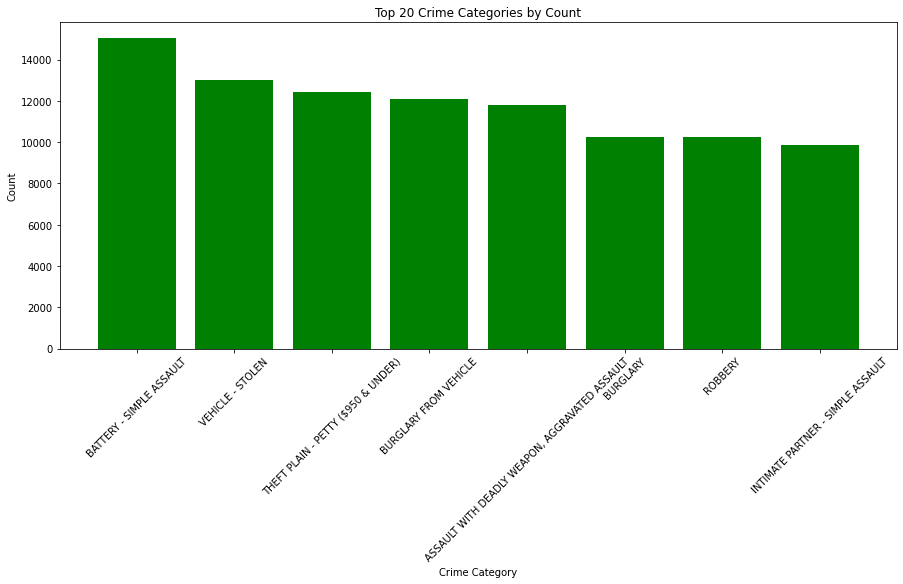

In [0]:
import matplotlib.pyplot as plt
top_20_data = df_update.groupBy(['Crm Cd desc','AREA NAME']).count().orderBy('count', ascending=False).limit(20)

categories = top_20_data.select('Crm Cd desc').rdd.flatMap(lambda x: x).collect()
counts = top_20_data.select('count').rdd.flatMap(lambda x: x).collect()

plt.figure(figsize=(15, 6))
plt.bar(categories, counts, color='green')

plt.title('Top 20 Crime Categories by Count')
plt.xlabel('Crime Category')
plt.ylabel('Count')

plt.xticks(rotation=45)
plt.show()

In [0]:
%sql
select district, crime_category, cnt from
(select 
  district, crime_category,cnt,rank() over (partition by district order by cnt desc) as rank
from (
  select `AREA NAME` as district, `Crm Cd Desc` as crime_category, count(*) as cnt
  from LA_crime
  group by 1, 2) t) t2
where t2.rank <=5
and t2.district in (select `AREA NAME` as district from LA_crime group by 1 order by count(*) desc limit 5)
order by 1

district,crime_category,cnt
77th Street,BATTERY - SIMPLE ASSAULT,15052
77th Street,ROBBERY,10251
77th Street,VEHICLE - STOLEN,12997
77th Street,INTIMATE PARTNER - SIMPLE ASSAULT,9852
77th Street,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",11800
N Hollywood,BURGLARY FROM VEHICLE,12082
N Hollywood,THEFT OF IDENTITY,9537
N Hollywood,THEFT PLAIN - PETTY ($950 & UNDER),8064
N Hollywood,BATTERY - SIMPLE ASSAULT,8498
N Hollywood,BURGLARY,7997


In [0]:
%sql
select year(`Date Rptd`) as year, `Crm Cd Desc` as crime_category, count(*) as count
from LA_crime
where `Crm Cd Desc` in (
  select cat from (
  select `Crm Cd Desc` as cat, count(*) from LA_crime where year(`Date Rptd`)>2015 group by 1 order by 2 desc limit 5) t1)
group by 1, 2
order by 1

year,crime_category,count
2010,VEHICLE - STOLEN,16459
2010,THEFT PLAIN - PETTY ($950 & UNDER),10812
2010,BURGLARY,15738
2010,BURGLARY FROM VEHICLE,17529
2010,BATTERY - SIMPLE ASSAULT,20332
2011,BATTERY - SIMPLE ASSAULT,19911
2011,BURGLARY FROM VEHICLE,15889
2011,THEFT PLAIN - PETTY ($950 & UNDER),14575
2011,BURGLARY,15897
2011,VEHICLE - STOLEN,15165


In [0]:
%sql
select year(`Date Rptd`) as year, `Crm Cd Desc` as crime_category, count(*) as count
from LA_crime
where `Crm Cd Desc` in (
  select cat from (
  select `Crm Cd Desc` as cat, count(*) from LA_crime where year(`Date Rptd`)>2015 group by 1 order by 2 desc limit 5) t1)
group by 1, 2
order by 1

year,crime_category,count
2010,VEHICLE - STOLEN,16459
2010,THEFT PLAIN - PETTY ($950 & UNDER),10812
2010,BURGLARY,15738
2010,BURGLARY FROM VEHICLE,17529
2010,BATTERY - SIMPLE ASSAULT,20332
2011,BATTERY - SIMPLE ASSAULT,19911
2011,BURGLARY FROM VEHICLE,15889
2011,THEFT PLAIN - PETTY ($950 & UNDER),14575
2011,BURGLARY,15897
2011,VEHICLE - STOLEN,15165


In [0]:
%sql
select year, crime_category, cnt from
(select 
  year, crime_category,cnt,rank() over (partition by year order by cnt desc) as rank
from (
  select year(`Date Rptd`) as year, `Crm Cd Desc` as crime_category, count(*) as cnt
  from LA_crime
  group by 1, 2) t) t2
where t2.rank <=5 and t2.year!=2020
order by 1

year,crime_category,cnt
2010,BURGLARY FROM VEHICLE,17529
2010,THEFT PLAIN - PETTY ($950 & UNDER),10812
2010,VEHICLE - STOLEN,16459
2010,BATTERY - SIMPLE ASSAULT,20332
2010,BURGLARY,15738
2011,BURGLARY FROM VEHICLE,15889
2011,THEFT PLAIN - PETTY ($950 & UNDER),14575
2011,BURGLARY,15897
2011,BATTERY - SIMPLE ASSAULT,19911
2011,VEHICLE - STOLEN,15165


In [0]:
#Q2 Counts the number of crimes for different district, and visualize your results

In [0]:
%sql
select * from LA_crime limit 5

DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON,hour_OCC,minute_OCC,second_OCC
001307355,2010-02-20,2010-02-20T12:00:00.000+0000,1970-01-01T13:50:00.000+0000,13,Newton,1385,2,900,VIOLATION OF COURT ORDER,0913 1814 2000,48,M,H,501,SINGLE FAMILY DWELLING,null,null,AA,Adult Arrest,900,null,null,null,300 E GAGE AV,null,33.9825,-118.2695,13,50,0
011401303,2010-09-13,2010-09-12T12:00:00.000+0000,1970-01-01T00:45:00.000+0000,14,Pacific,1485,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)",0329,0,M,W,101,STREET,null,null,IC,Invest Cont,740,null,null,null,SEPULVEDA BL,MANCHESTER AV,33.9599,-118.3962,0,45,0
070309629,2010-08-09,2010-08-09T12:00:00.000+0000,1970-01-01T15:15:00.000+0000,13,Newton,1324,2,946,OTHER MISCELLANEOUS CRIME,0344,0,M,H,103,ALLEY,null,null,IC,Invest Cont,946,null,null,null,1300 E 21ST ST,null,34.0224,-118.2524,15,15,0
090631215,2010-01-05,2010-01-05T12:00:00.000+0000,1970-01-01T01:50:00.000+0000,06,Hollywood,0646,2,900,VIOLATION OF COURT ORDER,1100 0400 1402,47,F,W,101,STREET,102,HAND GUN,IC,Invest Cont,900,998,null,null,CAHUENGA BL,HOLLYWOOD BL,34.1016,-118.3295,1,50,0
100100501,2010-01-03,2010-01-02T12:00:00.000+0000,1970-01-01T21:00:00.000+0000,01,Central,0176,1,122,"RAPE, ATTEMPTED",0400,47,F,H,103,ALLEY,400,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",IC,Invest Cont,122,null,null,null,8TH ST,SAN PEDRO ST,34.0387,-118.2488,21,0,0


In [0]:
display(df_update.groupBy('AREA NAME').count().orderBy('count', ascending=False))

AREA NAME,count
77th Street,145807
Southwest,135862
N Hollywood,114316
Pacific,112776
Southeast,111822
Mission,104010
Northeast,100560
Newton,100315
Van Nuys,100063
Hollywood,99312


In [0]:
%sql
select count(distinct `AREA NAME`) from LA_crime;

count(DISTINCT AREA NAME)
21


In [0]:
crimeArea = spark.sql("select \
                          `AREA NAME`,\
                           count(*) AS cnt \
                           FROM LA_crime \
                           GROUP BY 1 \
                           ORDER BY 2 DESC limit 10")
display(crimeArea)

AREA NAME,cnt
77th Street,145807
Southwest,135862
N Hollywood,114316
Pacific,112776
Southeast,111822
Mission,104010
Northeast,100560
Newton,100315
Van Nuys,100063
Hollywood,99312


In [0]:
%sql
select 
  `AREA NAME`,
  count(*) AS cnt
FROM LA_crime
GROUP BY 1
ORDER BY 2 DESC

AREA NAME,cnt
77th Street,145807
Southwest,135862
N Hollywood,114316
Pacific,112776
Southeast,111822
Mission,104010
Northeast,100560
Newton,100315
Van Nuys,100063
Hollywood,99312


In [0]:
crimes_pd_df = crimeArea.toPandas()

crimes_pd_df

,AREA NAME,cnt
0,77th Street,145807
1,Southwest,135862
2,N Hollywood,114316
3,Pacific,112776
4,Southeast,111822
5,Mission,104010
6,Northeast,100560
7,Newton,100315
8,Van Nuys,100063
9,Hollywood,99312


In [0]:
#Q3 Count the number of crimes each "Sunday" at "LA downtown"

In [0]:
df_opt1.head(n=1)

Out[143]: [Row(DR_NO='001307355', Date Rptd='02/20/2010 12:00:00 AM', DATE OCC='02/20/2010 12:00:00 AM', TIME OCC='1350', AREA ='13', AREA NAME='Newton', Rpt Dist No='1385', Part 1-2='2', Crm Cd='900', Crm Cd Desc='VIOLATION OF COURT ORDER', Mocodes='0913 1814 2000', Vict Age='48', Vict Sex='M', Vict Descent='H', Premis Cd='501', Premis Desc='SINGLE FAMILY DWELLING', Weapon Used Cd=None, Weapon Desc=None, Status='AA', Status Desc='Adult Arrest', Crm Cd 1='900', Crm Cd 2=None, Crm Cd 3=None, Crm Cd 4=None, LOCATION='300 E  GAGE                         AV', Cross Street=None, LAT='33.9825', LON='-118.2695')]

In [0]:
df_opt1.show(n=5)

+---------+--------------------+--------------------+--------+-----+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---------+
|    DR_NO|           Date Rptd|            DATE OCC|TIME OCC|AREA |AREA NAME|Rpt Dist No|Part 1-2|Crm Cd|         Crm Cd Desc|       Mocodes|Vict Age|Vict Sex|Vict Descent|Premis Cd|         Premis Desc|Weapon Used Cd|         Weapon Desc|Status| Status Desc|Crm Cd 1|Crm Cd 2|Crm Cd 3|Crm Cd 4|            LOCATION|        Cross Street|    LAT|      LON|
+---------+--------------------+--------------------+--------+-----+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+------------+--------+--------+--------

In [0]:
%sql
select * from LA_crime limit 5

DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON,hour_OCC,minute_OCC,second_OCC
001307355,2010-02-20,2010-02-20T12:00:00.000+0000,1970-01-01T13:50:00.000+0000,13,Newton,1385,2,900,VIOLATION OF COURT ORDER,0913 1814 2000,48,M,H,501,SINGLE FAMILY DWELLING,null,null,AA,Adult Arrest,900,null,null,null,300 E GAGE AV,null,33.9825,-118.2695,13,50,0
011401303,2010-09-13,2010-09-12T12:00:00.000+0000,1970-01-01T00:45:00.000+0000,14,Pacific,1485,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)",0329,0,M,W,101,STREET,null,null,IC,Invest Cont,740,null,null,null,SEPULVEDA BL,MANCHESTER AV,33.9599,-118.3962,0,45,0
070309629,2010-08-09,2010-08-09T12:00:00.000+0000,1970-01-01T15:15:00.000+0000,13,Newton,1324,2,946,OTHER MISCELLANEOUS CRIME,0344,0,M,H,103,ALLEY,null,null,IC,Invest Cont,946,null,null,null,1300 E 21ST ST,null,34.0224,-118.2524,15,15,0
090631215,2010-01-05,2010-01-05T12:00:00.000+0000,1970-01-01T01:50:00.000+0000,06,Hollywood,0646,2,900,VIOLATION OF COURT ORDER,1100 0400 1402,47,F,W,101,STREET,102,HAND GUN,IC,Invest Cont,900,998,null,null,CAHUENGA BL,HOLLYWOOD BL,34.1016,-118.3295,1,50,0
100100501,2010-01-03,2010-01-02T12:00:00.000+0000,1970-01-01T21:00:00.000+0000,01,Central,0176,1,122,"RAPE, ATTEMPTED",0400,47,F,H,103,ALLEY,400,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",IC,Invest Cont,122,null,null,null,8TH ST,SAN PEDRO ST,34.0387,-118.2488,21,0,0


In [0]:
dt_lat = 34.0432071
dt_lon = -118.2849729
edge_lat = 34.040713
edge_lon = -118.2467693
radius = ((edge_lat - dt_lat)**2 + (edge_lon - dt_lon)**2)**0.5
radius

Out[146]: 0.038284926378017385

In [0]:
def InDT(lat, lon):
  dist = ((float(lat) - dt_lat)**2 + (float(lon) - dt_lon)**2)**0.5
  if dist <= radius:
    return "LADT"
  else:
    return "non-DownTown"

from pyspark.sql.types import StringType
udf_InDT = udf(lambda z: InDT(z['LAT'],z['LON']), StringType())

df_update = df_update.withColumn('DownTown', udf_InDT(struct('LAT','LON')))
df_update.createOrReplaceTempView("LA_crime")
df_update.printSchema()

root
 |-- DR_NO: string (nullable = true)
 |-- Date Rptd: date (nullable = true)
 |-- DATE OCC: timestamp (nullable = true)
 |-- TIME OCC: timestamp (nullable = true)
 |-- AREA : string (nullable = true)
 |-- AREA NAME: string (nullable = true)
 |-- Rpt Dist No: string (nullable = true)
 |-- Part 1-2: string (nullable = true)
 |-- Crm Cd: string (nullable = true)
 |-- Crm Cd Desc: string (nullable = true)
 |-- Mocodes: string (nullable = true)
 |-- Vict Age: string (nullable = true)
 |-- Vict Sex: string (nullable = true)
 |-- Vict Descent: string (nullable = true)
 |-- Premis Cd: string (nullable = true)
 |-- Premis Desc: string (nullable = true)
 |-- Weapon Used Cd: string (nullable = true)
 |-- Weapon Desc: string (nullable = true)
 |-- Status: string (nullable = true)
 |-- Status Desc: string (nullable = true)
 |-- Crm Cd 1: string (nullable = true)
 |-- Crm Cd 2: string (nullable = true)
 |-- Crm Cd 3: string (nullable = true)
 |-- Crm Cd 4: string (nullable = true)
 |-- LOCATION:

In [0]:
%sql
select DownTown, count(*) as crime_count from LA_crime group by 1

DownTown,crime_count
non-DownTown,1813653
LADT,309066


In [0]:
%sql
select DownTown, `Crm Cd desc`, count(*) as crime_count
from LA_crime
group by 1,2
order by 2

DownTown,Crm Cd desc,crime_count
non-DownTown,ABORTION/ILLEGAL,6
LADT,ABORTION/ILLEGAL,1
non-DownTown,ARSON,3039
LADT,ARSON,492
non-DownTown,ASSAULT WITH DEADLY WEAPON ON POLICE OFFICER,1354
LADT,ASSAULT WITH DEADLY WEAPON ON POLICE OFFICER,250
non-DownTown,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",77068
LADT,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",15672
non-DownTown,ATTEMPTED ROBBERY,9164
LADT,ATTEMPTED ROBBERY,2831


In [0]:
#Q4 Analyze the number of crime in each month of 2015, 2016, 2017, 2018. Then, give your insights for the output for the output results. 

In [0]:
%sql
select 
  cast(year(`DATE OCC`) as string) as year, 
  count(*) as crime_count
from
  LA_crime
group by 1
order by 1

year,crime_count
2010,209306
2011,200902
2012,201814
2013,192846
2014,195837
2015,215902
2016,225939
2017,231690
2018,229675
2019,218808


In [0]:
%sql
select 
  month(`DATE OCC`) as month,
  count(*) as crime_count
from
  LA_crime
group by 1
order by 1 asc

month,crime_count
1,184633
2,157869
3,177227
4,173237
5,180716
6,177697
7,183388
8,183496
9,175653
10,182642


In [0]:
%sql
select 
  year(`DATE OCC`) as year, 
  count(*) as crime_count
from
  LA_crime
group by 1
order by 1

year,crime_count
2010,209306
2011,200902
2012,201814
2013,192846
2014,195837
2015,215902
2016,225939
2017,231690
2018,229675
2019,218808


In [0]:
#Q5 Analyze the number of crime w.r.t the hour in certian day like 2015/12/15, 2016/12/15. Then, give your travel suggestion to visit LA

In [0]:
"""from Q4 we know the crimes topped during July and Augest"""

temp = spark.sql(
"select \
  day(`DATE OCC`) as day, \
  count(*) as crime_count \
from LA_crime \
where month(`DATE OCC`) in (7,8) \
group by 1 \
order by 1")

display(temp)

day,crime_count
1,16997
2,11618
3,11670
4,11662
5,11590
6,11310
7,11141
8,11363
9,11099
10,11547


In [0]:
"""crime rate peaked around noon and was lowest during early morning (2am-7am)"""

temp = spark.sql(
"select \
  hour_OCC as `time(0~24)`, \
  count(*) as crime_count \
from LA_crime \
where month(`DATE OCC`) in (7,8) \
group by 1 \
order by 1")

display(temp)

time(0~24),crime_count
0,15739
1,11155
2,9535
3,7100
4,5415
5,4816
6,6550
7,8734
8,14716
9,13426


In [0]:
# #Q6 (1) Step1: Find out the top-3 danger district
# (2) Step2: Find out crime event w.r.t category and time (hour) from the result of step 1
# (3) Step3: Give your advice to distribute the police based on your analysis results

In [0]:
%sql
select
  `AREA NAME` as district,
  `Crm Cd desc` as crime_category,
  `hour_OCC` as time,
  count(*) as crime_count
from
  LA_crime
where `AREA NAME` in (
  select district from (
    select 
      `AREA NAME` as district, 
      count(*)
    from LA_crime
    group by 1
    order by 2 desc
    limit 3)
)
group by 1,2,3
order by 1 asc, 4 desc

district,crime_category,time,crime_count
77th Street,THEFT OF IDENTITY,12,2542
77th Street,VEHICLE - STOLEN,22,1188
77th Street,VEHICLE - STOLEN,21,1133
77th Street,VEHICLE - STOLEN,20,1075
77th Street,VEHICLE - STOLEN,19,943
77th Street,BATTERY - SIMPLE ASSAULT,20,940
77th Street,VEHICLE - STOLEN,18,933
77th Street,BATTERY - SIMPLE ASSAULT,19,911
77th Street,BATTERY - SIMPLE ASSAULT,12,888
77th Street,BATTERY - SIMPLE ASSAULT,15,884


In [0]:
#Q7 For different category of crime, find the percentage of resolution

In [0]:
%sql
select distinct Status,`Status Desc` from LA_crime

Status,Status Desc
CC,UNK
AO,Adult Other
JA,Juv Arrest
AA,Adult Arrest
JO,Juv Other
null,UNK
IC,Invest Cont
TH,UNK
13,UNK
19,UNK


In [0]:
%sql
select
  `Crm Cd desc` as crime_category,
  round(100-sum(case when `Status Desc` in ('Invest Cont', 'UNK') then 1 else 0 end) / count(*) *100,2) as resolved_pct
from LA_crime
group by 1
order by 2

crime_category,resolved_pct
DRUNK ROLL - ATTEMPT,0.0
TILL TAP - ATTEMPT,0.0
BLOCKING DOOR INDUCTION CENTER,0.0
TRAIN WRECKING,0.0
BOAT - STOLEN,1.06
PICKPOCKET,2.58
THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER),2.61
BIKE - STOLEN,2.94
"VEHICLE, STOLEN - OTHER (MOTORIZED SCOOTERS, BIKES, ETC)",3.28
THEFT FROM MOTOR VEHICLE - GRAND ($950.01 AND OVER),3.46


In [0]:
%sql
select
  `Crm Cd desc` as crime_category,
  round(100-sum(case when `Status Desc` in ('Invest Cont', 'UNK') then 1 else 0 end) / count(*) *100,2) as resolved_pct
from LA_crime
where `Crm Cd desc` in (select `Crm Cd desc` from LA_crime group by 1 order by count(*) desc limit 5)
group by 1
order by 2

crime_category,resolved_pct
BURGLARY FROM VEHICLE,4.26
VEHICLE - STOLEN,7.47
THEFT PLAIN - PETTY ($950 & UNDER),9.34
BURGLARY,11.92
BATTERY - SIMPLE ASSAULT,39.76


In [0]:
%sql
select
  `Crm Cd desc` as crime_category,
  `Crm Cd 1` as crime_id,
  round(100-sum(case when `Status Desc` in ('Invest Cont', 'UNK') then 1 else 0 end) / count(*) *100,2) as resolved_pct
from LA_crime
where `Crm Cd 1` is not null
and `Crm Cd 1` not in (111, 113) 
group by 2,1
order by 2
limit 5

crime_category,crime_id,resolved_pct
CRIMINAL HOMICIDE,110,62.74
"RAPE, FORCIBLE",121,52.91
"RAPE, ATTEMPTED",122,56.46
ORAL COPULATION,210,33.33
ROBBERY,210,27.62


In [0]:
%sql
select
  year(`DATE OCC`) as year,
  round(100-sum(case when `Status Desc` in ('Invest Cont', 'UNK') then 1 else 0 end) / count(*) *100,2) as resolved_pct
from LA_crime
group by 1
order by 1

year,resolved_pct
2010,16.86
2011,20.73
2012,24.72
2013,25.02
2014,25.96
2015,25.2
2016,24.43
2017,24.04
2018,23.72
2019,23.6


In [0]:
%sql
select
  `Crm Cd desc` as crime_category,
  `Crm Cd 1` as crime_id,
  `Vict Sex`,
  round(100-sum(case when `Status Desc` in ('Invest Cont', 'UNK') then 1 else 0 end) / count(*) *100,2) as resolved_pct
from LA_crime
where `Crm Cd 1` in (select distinct `Crm Cd 1` from LA_crime where `Crm Cd 1` not in (111, 113) order by 1 limit 5 )
and `Vict Sex` is not Null
group by 1,2,3
order by 2

crime_category,crime_id,Vict Sex,resolved_pct
CRIMINAL HOMICIDE,110,F,78.39
CRIMINAL HOMICIDE,110,X,0.0
CRIMINAL HOMICIDE,110,M,60.2
"RAPE, FORCIBLE",121,F,52.92
"RAPE, FORCIBLE",121,M,50.47
"RAPE, FORCIBLE",121,X,66.67
"RAPE, ATTEMPTED",122,F,56.9
"RAPE, ATTEMPTED",122,M,21.43
ORAL COPULATION,210,F,38.46
SODOMY/SEXUAL CONTACT B/W PENIS OF ONE PERS TO ANUS OTH,210,M,0.0


In [0]:
%sql
select
  `Vict Sex`,
  round(100-sum(case when `Status Desc` in ('Invest Cont', 'UNK') then 1 else 0 end) / count(*) *100,2) as resolved_pct
from LA_crime
where `Crm Cd 1` is not null
and `Vict Sex` in ('F','M')
group by 1

Vict Sex,resolved_pct
F,29.02
M,21.73


In [0]:
%sql
select
  `Crm Cd desc` as crime_category,
  `Crm Cd 1` as crime_id,
  `Vict Sex`,
  count(*) as cnt
from LA_crime
where `Crm Cd 1` in (select distinct `Crm Cd 1` from LA_crime where `Crm Cd 1` not in (111, 113) order by 1 limit 5 )
and `Vict Sex` in ('F', 'M')
and `Crm Cd desc` not like '%ROBBERY%'
group by 1,2,3
order by 2

crime_category,crime_id,Vict Sex,cnt
CRIMINAL HOMICIDE,110,F,384
CRIMINAL HOMICIDE,110,M,2387
"RAPE, FORCIBLE",121,F,10742
"RAPE, FORCIBLE",121,M,107
"RAPE, ATTEMPTED",122,F,1116
"RAPE, ATTEMPTED",122,M,14
ORAL COPULATION,210,M,2
SEXUAL PENETRATION W/FOREIGN OBJECT,210,F,4
ORAL COPULATION,210,F,13
SODOMY/SEXUAL CONTACT B/W PENIS OF ONE PERS TO ANUS OTH,210,M,3


In [0]:
#Time Series Analysis

In [0]:
%sql
select * from LA_crime limit 5

DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON,hour_OCC,minute_OCC,second_OCC,DownTown
001307355,2010-02-20,2010-02-20T12:00:00.000+0000,1970-01-01T13:50:00.000+0000,13,Newton,1385,2,900,VIOLATION OF COURT ORDER,0913 1814 2000,48,M,H,501,SINGLE FAMILY DWELLING,null,null,AA,Adult Arrest,900,null,null,null,300 E GAGE AV,null,33.9825,-118.2695,13,50,0,non-DownTown
011401303,2010-09-13,2010-09-12T12:00:00.000+0000,1970-01-01T00:45:00.000+0000,14,Pacific,1485,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)",0329,0,M,W,101,STREET,null,null,IC,Invest Cont,740,null,null,null,SEPULVEDA BL,MANCHESTER AV,33.9599,-118.3962,0,45,0,non-DownTown
070309629,2010-08-09,2010-08-09T12:00:00.000+0000,1970-01-01T15:15:00.000+0000,13,Newton,1324,2,946,OTHER MISCELLANEOUS CRIME,0344,0,M,H,103,ALLEY,null,null,IC,Invest Cont,946,null,null,null,1300 E 21ST ST,null,34.0224,-118.2524,15,15,0,non-DownTown
090631215,2010-01-05,2010-01-05T12:00:00.000+0000,1970-01-01T01:50:00.000+0000,06,Hollywood,0646,2,900,VIOLATION OF COURT ORDER,1100 0400 1402,47,F,W,101,STREET,102,HAND GUN,IC,Invest Cont,900,998,null,null,CAHUENGA BL,HOLLYWOOD BL,34.1016,-118.3295,1,50,0,non-DownTown
100100501,2010-01-03,2010-01-02T12:00:00.000+0000,1970-01-01T21:00:00.000+0000,01,Central,0176,1,122,"RAPE, ATTEMPTED",0400,47,F,H,103,ALLEY,400,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",IC,Invest Cont,122,null,null,null,8TH ST,SAN PEDRO ST,34.0387,-118.2488,21,0,0,LADT


In [0]:
ts = spark.sql(
"select \
  date(`DATE OCC`) as date, count(*) as number_of_crime \
from LA_crime \
group by 1 \
order by 1")

display(ts)

date,number_of_crime
2010-01-01,2349
2010-01-02,535
2010-01-03,539
2010-01-04,559
2010-01-05,548
2010-01-06,532
2010-01-07,550
2010-01-08,605
2010-01-09,631
2010-01-10,618


In [0]:
ts.show(n=3)

+----------+---------------+
|      date|number_of_crime|
+----------+---------------+
|2010-01-01|           2349|
|2010-01-02|            535|
|2010-01-03|            539|
+----------+---------------+
only showing top 3 rows



In [0]:
ts.filter("date is null or number_of_crime is null").show()

+----+---------------+
|date|number_of_crime|
+----+---------------+
+----+---------------+



In [0]:
ts.printSchema()

root
 |-- date: date (nullable = true)
 |-- number_of_crime: long (nullable = false)



In [0]:
import itertools
p = d = q = range(0,2)

# generate all different combinations of p, d and q triplets
pdq = list(itertools.product(p, d, q))

pdq

Out[174]: [(0, 0, 0),
 (0, 0, 1),
 (0, 1, 0),
 (0, 1, 1),
 (1, 0, 0),
 (1, 0, 1),
 (1, 1, 0),
 (1, 1, 1)]

In [0]:
p = d = q = range(0,2)

# generate all different combinations of p, d and q triplets
pdq = list(itertools.product(p, d, q))

# generate all different combinations of seasonal p, d and q triplets
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [0]:
y = ts.toPandas()
y.set_index('date', inplace=True)
# set index as DataTimeIndex
y.index = pd.to_datetime(y.index)
# The 'MS' string groups the data into buckets by start of the month
y = y['number_of_crime'].resample('MS').mean()
y.head()

Out[176]: date
2010-01-01    629.612903
2010-02-01    572.250000
2010-03-01    584.870968
2010-04-01    592.566667
2010-05-01    571.677419
Freq: MS, Name: number_of_crime, dtype: float64

In [0]:

%python
import statsmodels.api as sm
import warnings
warnings.filterwarnings("ignore") # specify to ignore warning messages

optimal = {'param':None, 'param_seasonal':None, 'aic':None}
for param in pdq:
  for param_seasonal in seasonal_pdq:
    try:
      mod = sm.tsa.statespace.SARIMAX(y,
                                      order=param,
                                      seasonal_order=param_seasonal,
                                      enforce_stationarity=False,
                                      enforce_invertibility=False)

      results = mod.fit()
      if (not optimal['aic']) or results.aic < optimal['aic']:
        optimal['param'] = param
        optimal['param_seasonal'] = param_seasonal
        optimal['aic'] = results.aic
        print('optimal updated')
      print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
    except:
      continue
print('optimal paramaters:', optimal)

optimal updated
ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:1854.9603773724007
optimal updated
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:1557.3653379059208
optimal updated
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:1032.3988901041985
optimal updated
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:917.912973865371
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:1044.7077470275756
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:1032.5382873131807
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:926.5577957988992
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:919.4511820588502
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:1686.1163360737683
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:1521.9650483442776
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:960.9214549297717
optimal updated
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:859.5926277363193
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:983.6298023118765
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:966.2002487790478
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:875.9151734685008
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:860.9361108633323
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - A

In [0]:
mod = sm.tsa.statespace.SARIMAX(y,
                                order=optimal['param'],
                                seasonal_order=optimal['param_seasonal'],
                                enforce_stationarity=False,
                                enforce_invertibility=False)

results = mod.fit()

print(results.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.3389      0.118     -2.871      0.004      -0.570      -0.108
ma.S.L12      -0.7839      0.131     -5.999      0.000      -1.040      -0.528
sigma2       189.0279     30.113      6.277      0.000     130.008     248.048


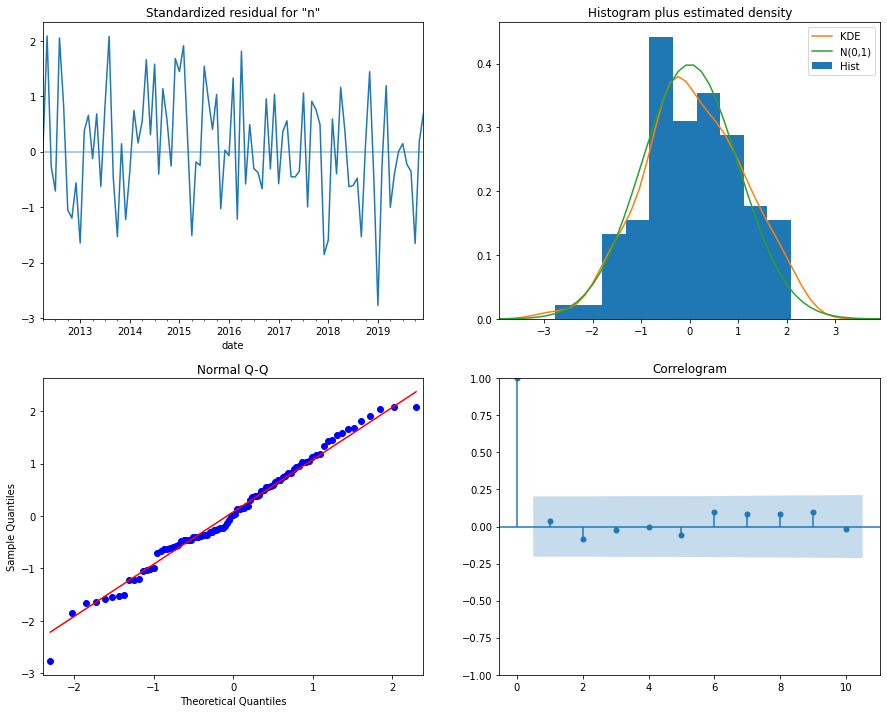

In [0]:
results.plot_diagnostics(figsize=(15, 12))
plt.show()

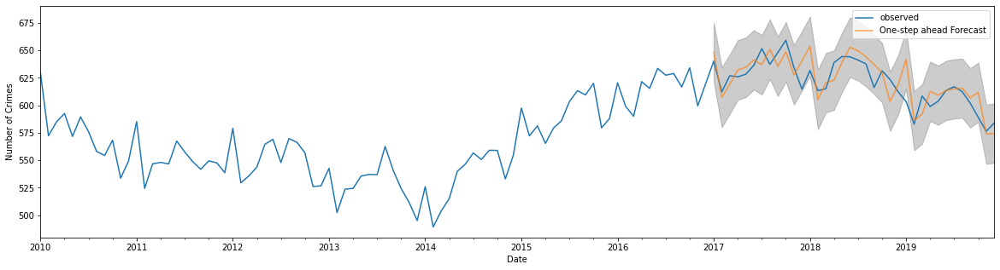

In [0]:
pred = results.get_prediction(start=pd.to_datetime('2017-01-01'), dynamic=False)
pred_ci = pred.conf_int()



ax = y.plot(label='observed', figsize=(20,5))
pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7)

ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)

ax.set_xlabel('Date')
ax.set_ylabel('Number of Crimes')
plt.legend()

plt.show()

In [0]:
y_forecasted = pred.predicted_mean
y_truth = y['2019-01-01':]

# Compute the mean square error
mse = ((y_forecasted - y_truth) ** 2).mean()
print('The Mean Squared Error of our forecasts is',mse)

The Mean Squared Error of our forecasts is 218.47195749503638


In [0]:
pred_uc = results.get_forecast(steps=50)

# Get confidence intervals of forecasts
pred_ci = pred_uc.conf_int()

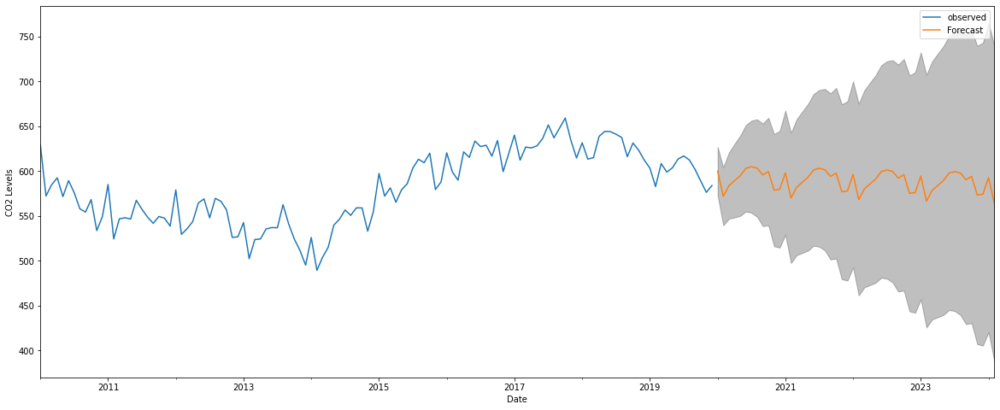

In [0]:
ax = y.plot(label='observed', figsize=(20, 8))
pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('CO2 Levels')

plt.legend()
plt.show()